In [24]:
import cv2
import os
from PIL import Image
from IPython.display import display
import numpy as np
import detect
import easyocr

### 이미지 준비

In [18]:
# 이미지 읽기
dir = 'data/TS_OBJ'
file_list = os.listdir(dir)

file_path = os.path.join(dir, file_list[0])
img = cv2.imread(file_path)

# display(Image.fromarray(img))

### OCR

In [26]:
OCR_img = img.copy()

reader = easyocr.Reader(['ko','en'])
results = reader.readtext(OCR_img)

for result in results:
    start_point = result[0][0]
    end_point = result[0][2]

    cv2.rectangle(OCR_img, start_point, end_point, (255, 255, 255), -1)

# display(Image.fromarray(OCR_img))
img= OCR_img.copy()

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


### 이미지 잘라내기

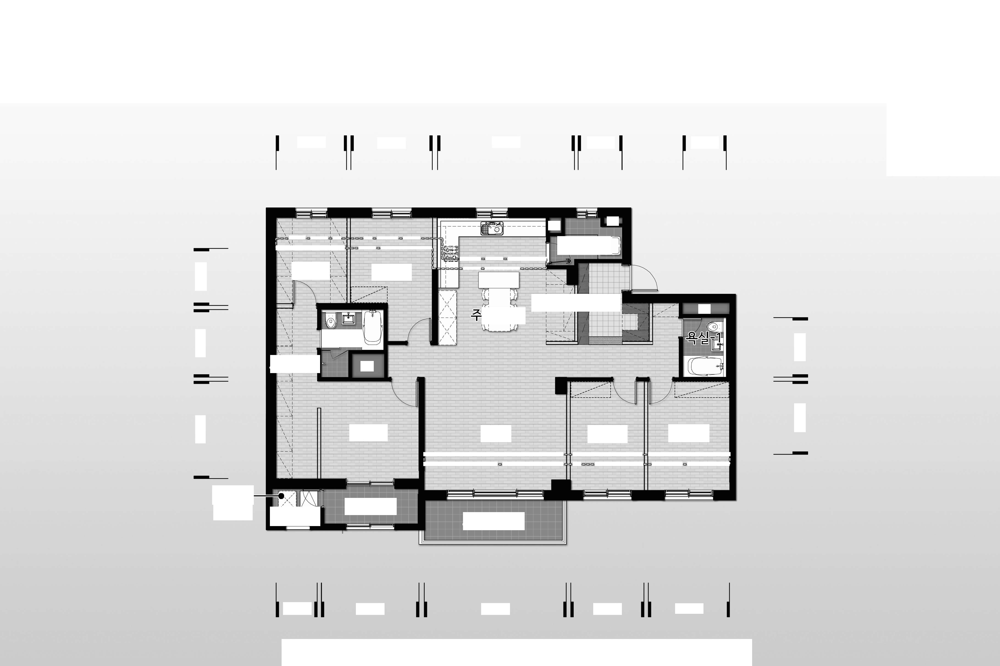

In [28]:
cropped_img = img.copy()

height, width = cropped_img.shape[:2]

pixel = 300
cropped_img = cropped_img[pixel:height-pixel, pixel:width-pixel]

display(Image.fromarray(cropped_img))
img= cropped_img.copy()

### 이미지 톤 죽이기

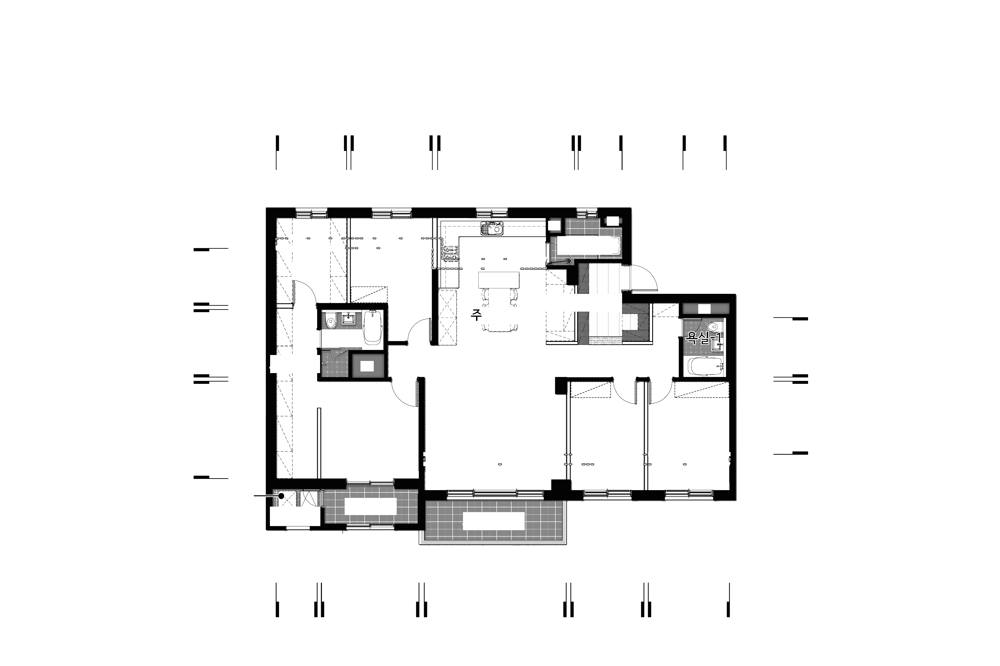

In [32]:
down_img = img.copy()

lower_bound = np.array([0, 0, 0], dtype=np.uint8)
upper_bound = np.array([150, 150, 150], dtype=np.uint8)
mask = cv2.inRange(down_img, lower_bound, upper_bound)
down_img[np.where(mask == 0)] = [255, 255, 255]

display(Image.fromarray(down_img))
img = down_img.copy()

### 도면 외곽 따기

41


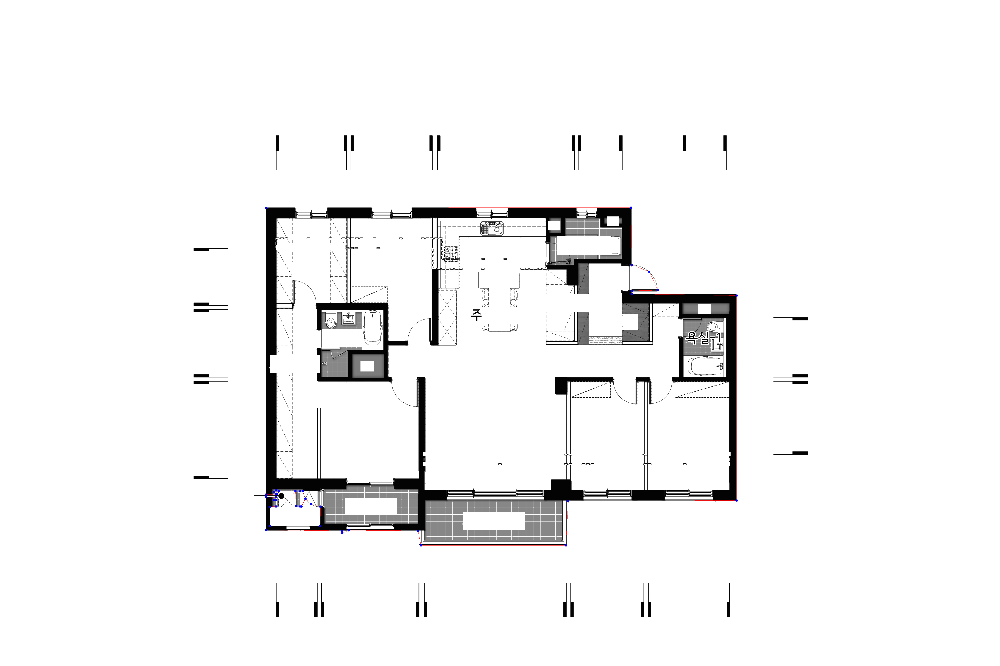

In [35]:
contour_image = img.copy()
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
contour, c_img = detect.outer_contours(gray, contour_image, color=(255,0,0))

print(len(contour))
for point in contour:
    point = point[0]  # 원하는 좌표를 이 변수에 설정하세요.

    color = (0, 0, 255)
    cv2.circle(contour_image, point, 5, color, -1)
    
display(Image.fromarray(contour_image))

### 도면 외부 정리하기

point_1 : (1159, 906) / point_2 : (3212, 2381)


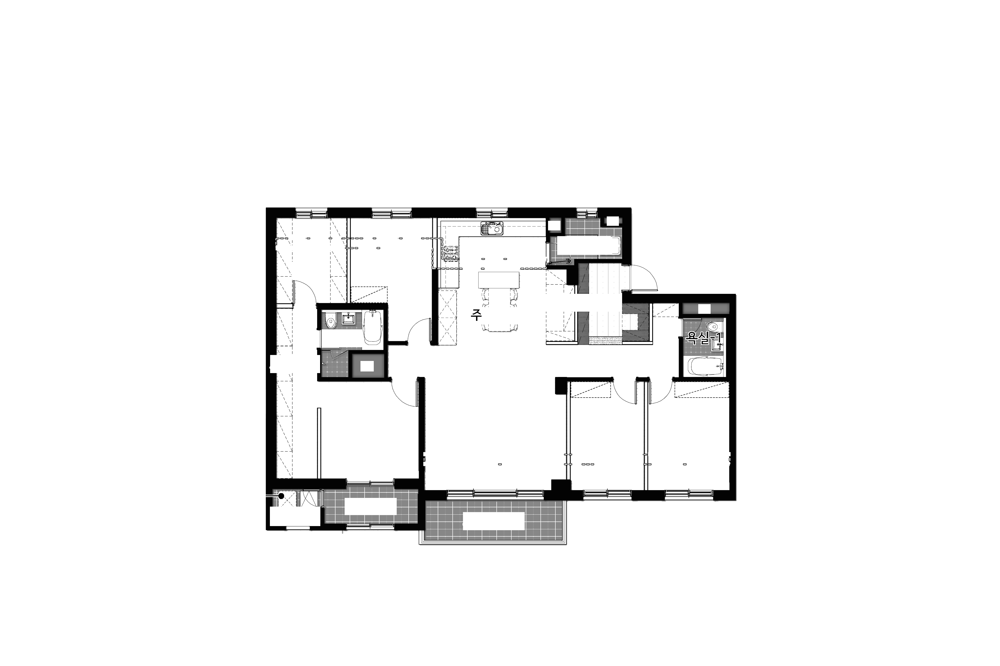

In [44]:
x_min, x_max = min([i[0][0] for i in contour]), max([i[0][0] for i in contour])
y_min, y_max = min([i[0][1] for i in contour]), max([i[0][1] for i in contour])

point_1 = (x_min, y_min)
point_2 = (x_max, y_max)

print(f'point_1 : {point_1} / point_2 : {point_2}')

clean_image = img.copy()

height, width = clean_image.shape[:2]
white_background = np.full((height, width, 3), 255, dtype=np.uint8)

rect_roi = clean_image[point_1[1]:point_2[1], point_1[0]:point_2[0]]

white_background[point_1[1]:point_2[1], point_1[0]:point_2[0]] = rect_roi

display(Image.fromarray(white_background))
img = white_background.copy()

In [63]:
def get_padding(image):
    image_copy = image.copy()
    height, width = image_copy.shape[:2]
    gray = cv2.cvtColor(image_copy,cv2.COLOR_BGR2GRAY)
    contour, c_img = detect.outer_contours(gray, image_copy, color=(255,0,0))

    x_min, x_max = min([i[0][0] for i in contour]), max([i[0][0] for i in contour])
    y_min, y_max = min([i[0][1] for i in contour]), max([i[0][1] for i in contour])

    padding_top, padding_left, padding_right, padding_bottom = y_min, x_min, width-x_max, height-y_max

    return [padding_top, padding_left, padding_right, padding_bottom]


def get_contour_size(image):
    image_copy = image.copy()
    gray = cv2.cvtColor(image_copy,cv2.COLOR_BGR2GRAY)
    contour, c_img = detect.outer_contours(gray, image_copy, color=(255,0,0))

    x_min, x_max = min([i[0][0] for i in contour]), max([i[0][0] for i in contour])
    y_min, y_max = min([i[0][1] for i in contour]), max([i[0][1] for i in contour])

    return [x_max-x_min, y_max-y_min]


# def resize_with_padding(img, scale_percent=60):
#     width = int(img.shape[1] * scale_percent / 100)
#     height = int(img.shape[0] * scale_percent / 100)
#     dim = (width, height)

#     resized = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)

#     background = np.ones_like(img) * 255  # 모든 픽셀을 흰색으로 설정합니다.

#     center_x = (img.shape[1] - width) // 2
#     center_y = (img.shape[0] - height) // 2

#     # 배경 이미지 위에 리사이즈된 이미지를 붙입니다.
#     background[center_y:center_y+height, center_x:center_x+width] = resized

    return background

# def resize_with_padding(img, target_size, scale_percent=None):
#     # 목표 크기로 스케일을 계산합니다.
#     height_ratio = target_size[1] / img.shape[0]
#     width_ratio = target_size[0] / img.shape[1]
#     ratio = min(height_ratio, width_ratio)

#     if scale_percent:
#         ratio = scale_percent / 100
    
#     width = int(img.shape[1] * ratio)
#     height = int(img.shape[0] * ratio)
#     dim = (width, height)
    
#     resized = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)
    
#     # 최종 이미지의 크기를 목표 크기로 설정합니다.
#     background = np.full((target_size[1], target_size[0], 3), 255, dtype=np.uint8)
    
#     # 리사이즈된 이미지를 가운데에 배치합니다.
#     center_x = (target_size[0] - width) // 2
#     center_y = (target_size[1] - height) // 2
#     background[center_y:center_y+height, center_x:center_x+width] = resized
    
#     return background

def resize_with_padding(img, target_size=None, scale_percent=None):
    if scale_percent is not None:
        # 비율에 따라 width와 height를 계산합니다.
        width = int(img.shape[1] * scale_percent / 100)
        height = int(img.shape[0] * scale_percent / 100)
    elif target_size is not None:
        # target_size를 기준으로 비율을 계산하여 width와 height를 결정합니다.
        scale = min(target_size[0] / img.shape[1], target_size[1] / img.shape[0])
        width = int(img.shape[1] * scale)
        height = int(img.shape[0] * scale)
    else:
        raise ValueError("Either target_size or scale_percent must be provided")

    # 리사이즈된 이미지의 크기로 dim을 설정합니다.
    dim = (width, height)
    resized = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)

    # 새로운 배경 이미지를 생성합니다. target_size가 제공되지 않은 경우, 원본 이미지의 크기를 사용합니다.
    background_size = target_size if target_size is not None else img.shape[:2]
    background = np.full((background_size[1], background_size[0], 3), 255, dtype=np.uint8)

    # 리사이즈된 이미지를 중앙에 위치시킵니다.
    center_x = (background_size[0] - width) // 2
    center_y = (background_size[1] - height) // 2
    background[center_y:center_y+height, center_x:center_x+width] = resized

    return background

contour_size : [2052, 1474]
height, width : (2908, 4361)
sssssssssss
1.912280701754386


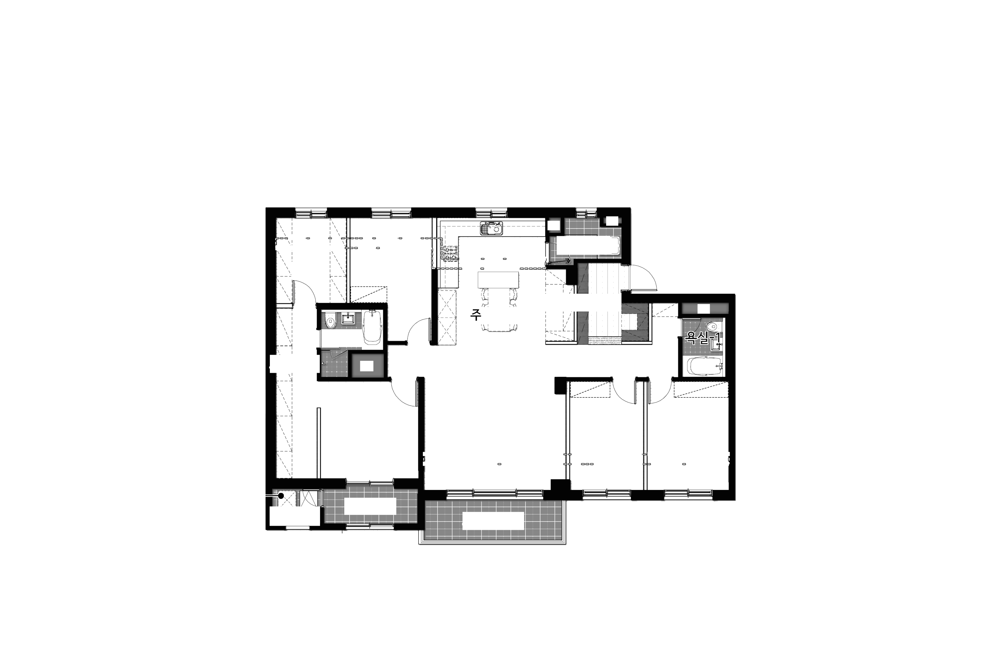

(2617, 3924, 3)


In [70]:
padding_img = img.copy()


# contour_size를 계산합니다.
contour_size = get_contour_size(padding_img)
print(f'contour_size : {contour_size}')
print(f'height, width : {padding_img.shape[:2]}')

height, width = padding_img.shape[:2]
default_size = [int(width*0.9), int(height*0.9)]

# if default_size[0] < contour_size[0] or default_size[1] < contour_size[1]:
#     ratio = min([default_size[0] / contour_size[0], default_size[1] / contour_size[1]])*100
#     padding_img = resize_with_padding(padding_img, scale_percent=ratio)
# elif contour_size[0] < default_size[0] and contour_size[1] < default_size[1]:
#     ratio = max([default_size[0] / contour_size[0], default_size[1] / contour_size[1]])*100
#     padding_img = resize_with_padding(padding_img, scale_percent=ratio)

# 이미지가 작은 경우 확대
if contour_size[0] < default_size[0] and contour_size[1] < default_size[1]:
    print('sssssssssss')
    scale = max(default_size[0] / contour_size[0], default_size[1] / contour_size[1])
    print(scale)
    padding_img = resize_with_padding(padding_img, target_size=default_size)

# 이미지가 큰 경우 축소
elif default_size[0] < contour_size[0] or default_size[1] < contour_size[1]:
    print('ddddddddddd')
    scale = min(default_size[0] / contour_size[0], default_size[1] / contour_size[1])
    print(scale)
    padding_img = resize_with_padding(padding_img, target_size=default_size)

display(Image.fromarray(padding_img))
print(padding_img.shape)

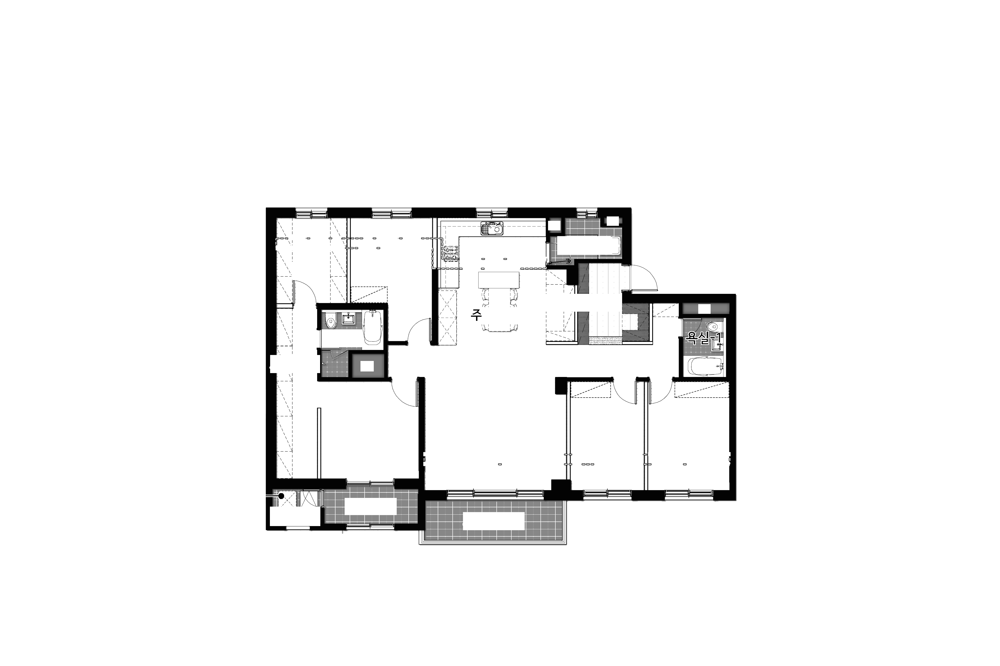

In [71]:
display(Image.fromarray(img))

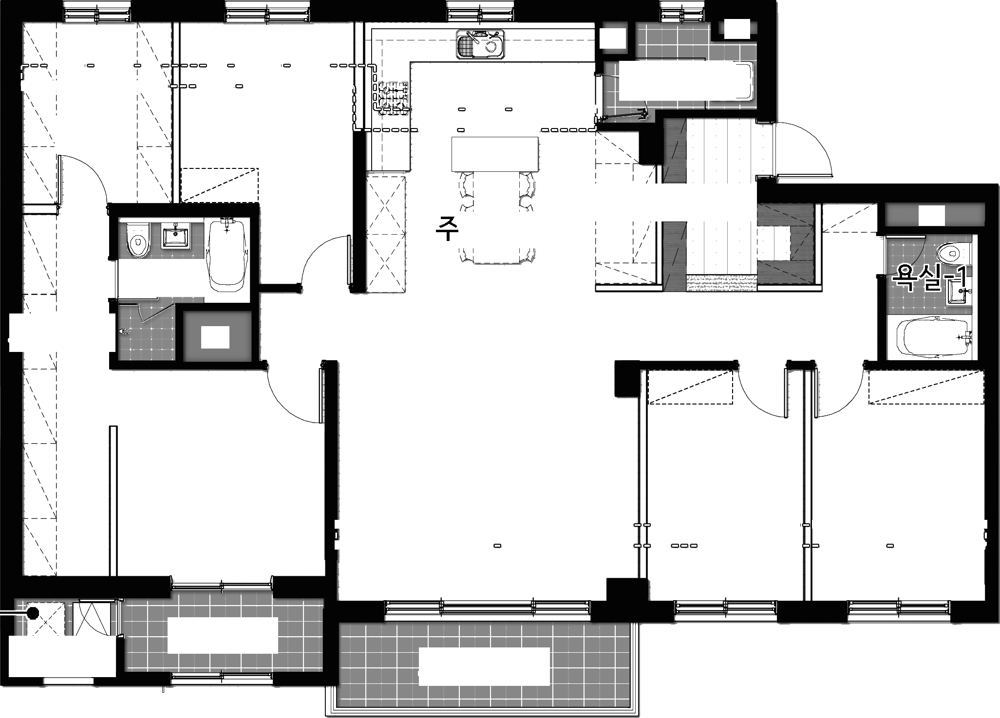

In [72]:
x_min, x_max = min([i[0][0] for i in contour]), max([i[0][0] for i in contour])
y_min, y_max = min([i[0][1] for i in contour]), max([i[0][1] for i in contour])

point_1 = (x_min, y_min)
point_2 = (x_max, y_max)

rect = img[point_1[1]:point_2[1], point_1[0]:point_2[0]]

display(Image.fromarray(rect))

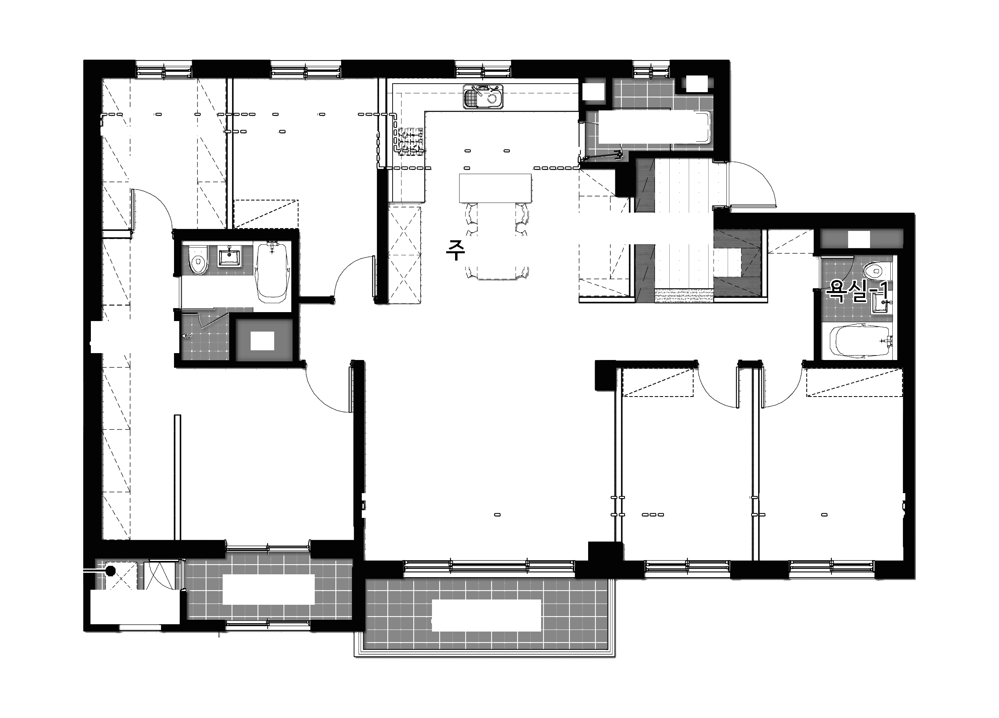

In [74]:
rect

# 이미지의 원래 크기를 구합니다.
height, width, _ = rect.shape

padding_percent = 0.1  # 10%

# 각 방향으로 추가할 픽셀 수를 계산합니다.
padding_width = int(width * padding_percent)
padding_height = int(height * padding_percent)

# 이미지에 패딩을 추가합니다. 여기서는 모든 방향에 동일한 크기의 흰색 패딩을 추가합니다.
padded_img = cv2.copyMakeBorder(rect,
                                padding_height,  # top 패딩
                                padding_height,  # bottom 패딩
                                padding_width,   # left 패딩
                                padding_width,   # right 패딩
                                cv2.BORDER_CONSTANT,
                                value=[255, 255, 255])  # 흰색 패딩

display(Image.fromarray(cv2.cvtColor(padded_img, cv2.COLOR_BGR2RGB)))

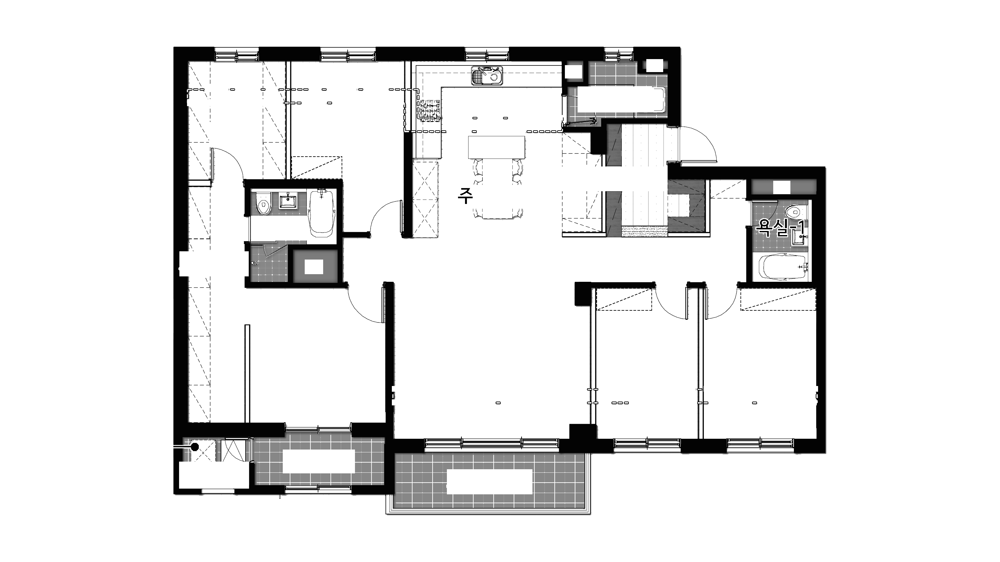

In [76]:
# 원본 이미지의 크기와 비율을 가져옵니다.
original_height, original_width = padded_img.shape[:2]
original_aspect_ratio = original_width / original_height

# 원하는 이미지의 비율을 설정합니다 (예: 16:9).
desired_aspect_ratio = 16 / 9

# 원본 이미지의 비율과 원하는 비율을 비교합니다.
if original_aspect_ratio > desired_aspect_ratio:
    # 원본 이미지가 더 넓다면 상하에 패딩을 추가합니다.
    new_width = original_width
    new_height = int(original_width / desired_aspect_ratio)
    padding_top = (new_height - original_height) // 2
    padding_bottom = new_height - original_height - padding_top
    padding_left = padding_right = 0
elif original_aspect_ratio < desired_aspect_ratio:
    # 원본 이미지가 더 높다면 좌우에 패딩을 추가합니다.
    new_height = original_height
    new_width = int(original_height * desired_aspect_ratio)
    padding_left = (new_width - original_width) // 2
    padding_right = new_width - original_width - padding_left
    padding_top = padding_bottom = 0
else:
    # 비율이 이미 원하는 비율과 동일합니다.
    padding_top = padding_bottom = padding_left = padding_right = 0

# 패딩을 추가하여 이미지의 비율을 변경합니다.
padded_img = cv2.copyMakeBorder(padded_img, padding_top, padding_bottom, padding_left, padding_right, cv2.BORDER_CONSTANT, value=[255, 255, 255])

# Jupyter Notebook에서 결과를 표시하려면 PIL Image 객체로 변환합니다.
display(Image.fromarray(cv2.cvtColor(padded_img, cv2.COLOR_BGR2RGB)))